In [ ]:
# This is the revise version of the link: 

In [29]:
from keras          import metrics
from PIL            import Image

from keras.models                import Model
from keras.applications.vgg16    import VGG16
from keras.applications.resnet50 import ResNet50
from keras.applications.vgg16    import decode_predictions
from keras.utils.np_utils        import to_categorical

import keras.backend     as K
import numpy             as np
import matplotlib.pyplot as plt
import tensorflow as tf

import os

In [30]:
import warnings

warnings.filterwarnings('ignore')

In [31]:
### error here
def limit_mem():
    cfg                          = tf.compat.v1.ConfigProto()
    cfg.gpu_options.allow_growth = True
    K.set_session(K.tensorflow_backend._has_compat_v1.session(config = cfg))

In [32]:
### error here
#limit_mem()

In [33]:
folder = '/home/chen/LiChiChang/2020SpringThesis/dataset/CatDog/shrink/Adversial/'

In [34]:
imagenet_mean = np.array([123.68, 116.779, 103.939], dtype = np.float32)
preprocess    = lambda x: (x - imagenet_mean)[:, :, :, ::-1]
deprocess     = lambda x: (x[:, :, :, ::-1] + imagenet_mean)

def get_gradient_signs(model, original_array):
    target_idx      = model.predict(original_array).argmin()
    target          = to_categorical(target_idx, 1000)
    target_variable = K.variable(target)
    loss            = metrics.categorical_crossentropy(model.output, target_variable)
    gradients       = K.gradients(loss, model.input)
    get_grad_values = K.function([model.input], gradients)
    grad_values     = get_grad_values([original_array])[0]
    grad_signs      = np.sign(grad_values)
    
    return grad_signs
    
def pertubate_image(preprocessed_array, perturbation):
    modified_array  = preprocessed_array - perturbation
    deprocess_array = np.clip(deprocess(modified_array), 0., 255.).astype(np.uint8)
    
    return deprocess_array

def generate_titles(display_model, preprocessed_array, perturbation, modified_array):
    title_original     = generate_title(display_model, preprocessed_array)
    title_perturbation = generate_title(display_model, perturbation)
    title_modified     = generate_title(display_model, modified_array)
    
    return title_original, title_perturbation, title_modified

def generate_adversarial_example(pertubation_model, original_array, epsilon):
    gradient_signs = get_gradient_signs(pertubation_model, original_array)
    perturbation   = gradient_signs * epsilon
    modified_image = pertubate_image(original_array, perturbation)
    
    return modified_image, perturbation

def load_image(filename):
    original_pic   = Image.open(filename).resize((224, 224))
    original_array = np.expand_dims(np.array(original_pic), 0)

    return original_array
    
def create_title(category, proba):
    return '"%s" %.1f%% confidence' % (category.replace('_', ' '), proba * 100) 

def generate_title(model, array):
    prediction = model.predict(array)
    _, category, proba = decode_predictions(prediction)[0][0]
    
    return create_title(category, proba)
    
def generate_adversarial_examples(folder, title, perturbation_model, display_model = None, epsilon = 5):
    if not display_model:
        display_model = perturbation_model

    filenames   = os.listdir(folder)
    line_number = len(filenames)
    plt.figure(figsize = (15, 10 * line_number))
    
    for line, filename in enumerate(filenames):
        original_array               = load_image(folder + filename)
        preprocessed_array           = preprocess(original_array)    
        modified_image, perturbation = generate_adversarial_example(perturbation_model, preprocessed_array, epsilon)
        preprocess_modified          = preprocess(modified_image)
        orig_tit, pert_tit, modi_tit = generate_titles(display_model, preprocessed_array, perturbation, preprocess_modified)

        plt.subplot(line_number, 3, 3 * line + 1)
        plt.imshow(original_array[0])
        plt.title(orig_tit)
        plt.subplot(line_number, 3, 3 * line + 2)
        plt.imshow(perturbation[0])
        plt.title(pert_tit)
        plt.subplot(line_number, 3, 3 * line + 3)
        plt.imshow(modified_image[0])
        plt.title(modi_tit)
        
    plt.suptitle(title)
    plt.tight_layout(pad = 4)

In [35]:
vgg16    = VGG16()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

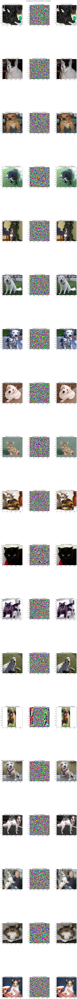

In [36]:
generate_adversarial_examples(folder, 'Perturbation using VGG16, classification using VGG16', perturbation_model = vgg16, display_model = vgg16)